In [ ]:
"""
Copywright @ 2023AIY7582-Akash Kumar Singh-IIT Delhi
"""

In [ ]:
!pip install ultralytics tensorboard kagglehub

In [3]:
import kagglehub, os, shutil
from PIL import Image
import cv2
from ultralytics import YOLO

In [4]:
ASSIGNMENT_DIR = "2023aiy7582"      # main directory

## Dataset taken from: https://www.kaggle.com/datasets/kushagra3204/cricket-ball-dataset-for-yolo
DATASET_KAGGLE_PATH = "kushagra3204/cricket-ball-dataset-for-yolo"
TARGET_DATASET_DIR = os.path.join(ASSIGNMENT_DIR, "datasets")  # dataset folder
YAML_FILE_PATH = os.path.join(ASSIGNMENT_DIR, "cricket_ball.yaml")
IMAGE_SIZE = 1920    # multiple of 32
EPOCHS = 25
BATCH = 4
MODEL = "yolo11s.pt" # base YOLO model
SAVE_DIR = os.path.join(ASSIGNMENT_DIR, "YOLO_Results")  # model & logs folder
CUSTOM_MODEL_NAME = "cricket_ball_best.pt"

In [5]:
# ---------------- Prepare Assignment Directory ----------------
os.makedirs(ASSIGNMENT_DIR, exist_ok=True)
os.makedirs(TARGET_DATASET_DIR, exist_ok=True)
os.makedirs(SAVE_DIR, exist_ok=True)

In [6]:
logger = 'TensorBoard'

if logger == 'TensorBoard':
  !yolo settings tensorboard=True
  %load_ext tensorboard
  %tensorboard --logdir {SAVE_DIR}
elif logger == 'Weights & Biases':
  !yolo settings wandb=True

✅ Updated 'tensorboard=True'
JSONDict("/root/.config/Ultralytics/settings.json"):
{
  "settings_version": "0.0.6",
  "datasets_dir": "/content/datasets",
  "weights_dir": "weights",
  "runs_dir": "runs",
  "uuid": "569f3ba64b326db489132663f79cd37279811de477381b83ac131e6cdd129cbb",
  "sync": true,
  "api_key": "",
  "openai_api_key": "",
  "clearml": true,
  "comet": true,
  "dvc": true,
  "hub": true,
  "mlflow": true,
  "neptune": true,
  "raytune": true,
  "tensorboard": true,
  "wandb": false,
  "vscode_msg": true,
  "openvino_msg": true
}
💡 Learn more about Ultralytics Settings at https://docs.ultralytics.com/quickstart/#ultralytics-settings
The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [7]:
# ---------------- Download Dataset ----------------
tmp_path = kagglehub.dataset_download(DATASET_KAGGLE_PATH)

if os.path.exists(TARGET_DATASET_DIR):
    shutil.rmtree(TARGET_DATASET_DIR)
shutil.copytree(tmp_path, TARGET_DATASET_DIR)

# Delete any .cache files
for root, _, files in os.walk(TARGET_DATASET_DIR):
    for file in files:
        if file.endswith(".cache"):
            os.remove(os.path.join(root, file))

print("Dataset ready at:", TARGET_DATASET_DIR)


# ---------------- Automatically detect dataset subfolder ----------------
subfolders = [f for f in os.listdir(TARGET_DATASET_DIR) if os.path.isdir(os.path.join(TARGET_DATASET_DIR, f))]
if len(subfolders) == 1:
    DATASET_SUBFOLDER = subfolders[0]  # e.g., 'cricket_ball_data'
else:
    DATASET_SUBFOLDER = ""  # already flat

dataset_root = os.path.join(TARGET_DATASET_DIR, DATASET_SUBFOLDER)
print("Dataset root detected:", dataset_root)

Using Colab cache for faster access to the 'cricket-ball-dataset-for-yolo' dataset.
Dataset ready at: 2023aiy7582/datasets
Dataset root detected: 2023aiy7582/datasets/cricket_ball_data


In [8]:
# ---------------- Create YAML ----------------
# Train/val/test sets as 1) dir: path/to/imgs

yaml_text = f"""
path: {dataset_root}  # dataset root (absolute path)
train: train/images
val: valid/images
test: test/images

names:
  0: cricketBall
"""

with open(YAML_FILE_PATH, "w") as f:
    f.write(yaml_text.strip())

print("YAML file created:", YAML_FILE_PATH)

YAML file created: 2023aiy7582/cricket_ball.yaml


In [9]:
# ---------------- Download pre-trained YOLO model ----------------
model = YOLO(MODEL)

In [10]:
# ---------------- Train YOLO ----------------
## https://docs.ultralytics.com/modes/train/#train-settings

results = model.train(
    data=YAML_FILE_PATH,
    epochs=EPOCHS,
    batch=BATCH,
    imgsz=IMAGE_SIZE,
    rect = True,
    project=SAVE_DIR,
    name="yolov11_cricket_ball",
    save=True,
    exist_ok=True,
    patience=10,
    device=0,
    plots=True,
)

# ---------------- Save Best Model ----------------
best_model_src = os.path.join(SAVE_DIR, "yolov11_cricket_ball", "weights", "best.pt")
custom_model_path = os.path.join(SAVE_DIR, "yolov11_cricket_ball", CUSTOM_MODEL_NAME)

if os.path.exists(best_model_src):
    os.rename(best_model_src, custom_model_path)
    print("Best model saved as:", custom_model_path)
else:
    print("best.pt not found!")

Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=2023aiy7582/cricket_ball.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=25, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1920, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov11_cricket_ball, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=10, perspective=0.0, plots=T

In [13]:
# ---------------- Evaluate model ----------------
metrics = model.val(
    data=YAML_FILE_PATH,
    imgsz=IMAGE_SIZE,
    device=0
)

Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 22.9±18.9 MB/s, size: 54.0 KB)
val: Scanning /content/2023aiy7582/datasets/cricket_ball_data/valid/labels.cache... 63 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 63/63 121.2Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 3.4s/it 13.7s
                   all         63         92      0.183       0.12      0.194     0.0821
Speed: 81.5ms preprocess, 87.3ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to /content/runs/detect/val3


In [14]:
# Load a model
model = YOLO("2023aiy7582/YOLO_Results/yolov11_cricket_ball/cricket_ball_best.pt")  # load a pretrained model (recommended for training)

In [ ]:
predict_imgs = [
    "/content/1.png",
    "/content/2.png",

    ]
# Predict with the model
results = model(source= predict_imgs, stream = False)  # predict on an image, # list of Results objects

# Access the results
for result in results:
    xywh = result.boxes.xywh  # center-x, center-y, width, height
    xywhn = result.boxes.xywhn  # normalized
    xyxy = result.boxes.xyxy  # top-left-x, top-left-y, bottom-right-x, bottom-right-y
    xyxyn = result.boxes.xyxyn  # normalized
    names = [result.names[cls.item()] for cls in result.boxes.cls.int()]  # class name of each box
    print('names', names)
    confs = result.boxes.conf  # confidence score of each box


0: 1088x1920 (no detections), 91.8ms
1: 1088x1920 (no detections), 91.8ms
Speed: 9.4ms preprocess, 91.8ms inference, 0.4ms postprocess per image at shape (1, 3, 1088, 1920)
names []
names []


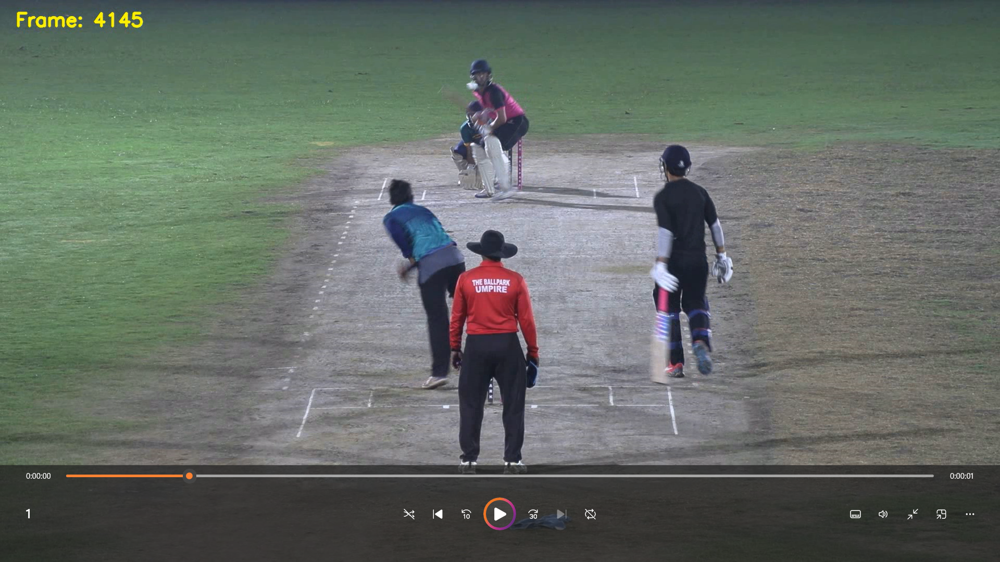

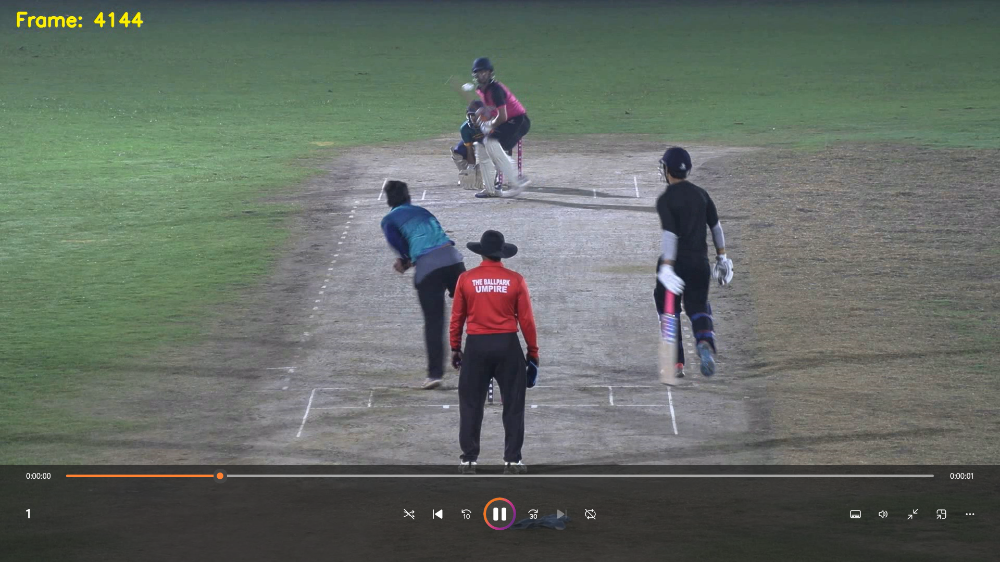

In [17]:
# Visualize the results
for i, r in enumerate(results):
    # Plot results image
    im_bgr = r.plot()  # BGR-order numpy array
    im_rgb = Image.fromarray(im_bgr[..., ::-1])  # RGB-order PIL image

    # Show results to screen (in supported environments)
    r.show()